<a href="https://colab.research.google.com/github/dilya22/dilya22/blob/main/Milwaukee_property_sale.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>



# **Prediction of Milwaukee Property Prices** 


 This script explores property sales data obtained from Milwaukee city clerk public records
 https://data.milwaukee.gov/dataset/property-sales-data. The dataset covers real estate sales from 2002-2021, including 20 variables and about 53,600 observations. The data is cleaned, analyzed and run through regression and machine learning methods to predict the property prices. Lastly, the method with the best result is selected and the feature importance is generated.

## 1. Data Loading
In this section:
*   import libraries
*   export dataset from csv file & store it to pandas dataframe  



Import the necessary libraries.

In [ ]:
# Import the modules

import os, glob
import numpy as np
import pandas as pd
import seaborn as sns
from scipy import stats
import matplotlib.pyplot as plt
import matplotlib.ticker 
from sklearn.preprocessing import LabelEncoder
import time
import warnings
warnings.filterwarnings("ignore")

import plotly.offline as py
import plotly.graph_objs as go
import plotly.tools as tls
import plotly.figure_factory as ff
import plotly.express as px

from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split 
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler

# Metrics
from sklearn import metrics
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.model_selection import cross_val_score

# Regression/ML methods
from sklearn.linear_model import LinearRegression, Lasso, Ridge
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.neighbors import KNeighborsRegressor
import xgboost as xgb
import lightgbm

# Import Google drive
from google.colab import drive
drive.mount('/content/drive')

# Set display options
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Read all csv files and store the dataset to a single pandas dataframe.

In [ ]:
working_directory = '/content/drive/MyDrive/data_analysis/Milwaukee_property_sale'
os.chdir(working_directory)

all_files = glob.iglob(os.path.join(working_directory, "*.csv"))
df_from_each_file = (pd.read_csv(f) for f in all_files)
df = pd.concat(df_from_each_file, ignore_index=True)

print (df.shape)

(53596, 20)


Our dataset has 20 features with 53596 observations. 
Print the first 10 rows of the dataframe.

In [ ]:
df.head(10)

,PropType,taxkey,Address,CondoProject,District,nbhd,Style,Extwall,Stories,Year_Built,Rooms,FinishedSqft,Units,Bdrms,Fbath,Hbath,Lotsize,Sale_date,Sale_price,PropertyID
0,Commercial,3.230461e+09,2628 N 6TH ST,NaN,6.0,6258.0,Commercial Exempt,NaN,2.0,1880.0,0.0,1840,1.0,0.0,0.0,0.0,12750,2002-01,15900.0,NaN
1,Commercial,3.590192e+09,1363 N PROSPECT AV,NaN,3.0,6262.0,Mansions With Commercial Usage,NaN,2.0,1876.0,0.0,6377,1.0,0.0,0.0,0.0,11840,2002-01,850000.0,NaN
2,Commercial,4.161194e+09,617 S 94TH ST,NaN,10.0,6272.0,Service Building,NaN,1.0,1954.0,0.0,5022,1.0,0.0,0.0,0.0,9700,2002-01,119000.0,NaN
3,Commercial,1.719836e+09,3624 W SILVER SPRING DR,NaN,1.0,6218.0,"Store Bldg - Multi Story (Store & Apt, Store & O",NaN,2.0,1955.0,0.0,6420,1.0,0.0,0.0,0.0,8792,2002-01,210000.0,NaN
4,Commercial,3.480290e+09,3830 W LISBON AV,NaN,15.0,6254.0,"Store Bldg - Multi Story (Store & Apt, Store & O",NaN,2.0,1909.0,0.0,5956,1.0,0.0,0.0,0.0,4840,2002-01,48500.0,NaN
5,Commercial,4.069983e+09,320 N 76TH ST,NaN,10.0,6272.0,Strip Shopping Center,NaN,1.0,1954.0,0.0,14200,1.0,0.0,0.0,0.0,16696,2002-01,885000.0,NaN
6,Commercial,4.320050e+09,1110 W GREENFIELD AV,NaN,12.0,6277.0,Strip Shopping Center,NaN,1.0,1974.0,0.0,3750,1.0,0.0,0.0,0.0,10400,2002-01,186000.0,NaN
7,Commercial,6.259989e+09,1233 W LAYTON AV,NaN,13.0,6418.0,Svs Station w Conv Store,NaN,1.0,2002.0,0.0,2775,1.0,0.0,0.0,0.0,14400,2002-01,225000.0,NaN
8,Commercial,4.670522e+09,2000 S 6TH ST,NaN,12.0,6278.0,Tavern,NaN,2.0,1887.0,0.0,3818,1.0,0.0,0.0,0.0,3040,2002-01,100000.0,NaN
9,Commercial,3.211121e+09,1000 E NORTH AV,NaN,3.0,6260.0,Tavern,NaN,2.0,1890.0,0.0,2142,1.0,0.0,0.0,0.0,2500,2002-01,150000.0,NaN


## 2. Data Cleaning
In this section:
*  correct the variable types
*  add sale_month, sale_year & prop_age variables
* generate discriptive statistics of numerical variables
*   delete variables that are not useful 
*   correct the typos in categorical variables values to avoid erroneous multiple entries
* fill in the empty cells according to the existing value proportions




Neighborhoods 'nbhd' are number coded and no documentation on the dataset website regarding how the number codes were chosen. Hence, it will not be included in the model. 

The 'district' is numbered 1-15 too, and there are district 1 to district 15 in Milwaukee. Hence, keep working with it.

In [ ]:
# Delete the neighborhood variable i.e. nbhd column.

df.drop(labels='nbhd', axis=1, inplace=True)

Change the variable names to lowercase for convenience 

In [ ]:
df.columns= df.columns.str.lower()

# Column data type
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 53596 entries, 0 to 53595
Data columns (total 19 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   proptype      53584 non-null  object 
 1   taxkey        53595 non-null  float64
 2   address       53591 non-null  object 
 3   condoproject  9196 non-null   object 
 4   district      53593 non-null  float64
 5   style         53542 non-null  object 
 6   extwall       41052 non-null  object 
 7   stories       53505 non-null  float64
 8   year_built    53564 non-null  float64
 9   rooms         52767 non-null  float64
 10  finishedsqft  53544 non-null  object 
 11  units         53595 non-null  float64
 12  bdrms         52768 non-null  float64
 13  fbath         52940 non-null  float64
 14  hbath         48755 non-null  float64
 15  lotsize       53594 non-null  object 
 16  sale_date     53595 non-null  object 
 17  sale_price    53585 non-null  float64
 18  propertyid    19072 non-nu

Update the variable types appropriately and create 3 new variables sale_month, sale_year & prop_age that stores property's age.

In [ ]:
# Specifying date variable and correcting its type
df['sale_date'] = pd.to_datetime(df['sale_date'], errors='coerce')

# Creating year and month columns from date
df['sale_year'] = pd.DatetimeIndex(df['sale_date']).year
df['sale_month'] = pd.DatetimeIndex(df['sale_date']).month

# Correcting categorical variables types
categorical = ["propertyid","taxkey",'district']
for col in categorical: 
    df[col] = df[col].astype(object)

# Correcting numerical variables types
numeric = ["finishedsqft","lotsize","sale_price" ]
for col in numeric: 
    df[col] = pd.to_numeric(df[col], errors='coerce')

# Create a new column for property's age
df['prop_age']= df['sale_year']-df['year_built']

Now there are 22 features due to 3 new columns added above. Generate descriptive statistics of numerical variables.

In [ ]:
round(df.describe([0.25, 0.75, 0.90, 0.95, 0.99]), 3)

,stories,year_built,rooms,finishedsqft,units,bdrms,fbath,hbath,lotsize,sale_price,sale_year,sale_month,prop_age
count,53505.000,53564.000,52767.000,42980.000,53595.000,52768.000,52940.000,48755.000,42513.000,5.358500e+04,53595.000,53595.000,53564.000
mean,1.339,1922.389,2.609,2499.891,1.421,2.924,1.341,0.321,7227.545,2.389840e+05,2016.089,6.769,93.697
std,0.621,209.668,3.341,9165.003,6.808,8.943,0.714,0.514,23911.783,1.228742e+06,4.108,3.098,209.246
min,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000000e+00,2002.000,1.000,-7.000
25%,1.000,1923.000,0.000,1019.000,1.000,2.000,1.000,0.000,3500.000,9.900000e+04,2014.000,4.000,55.000
50%,1.000,1950.000,0.000,1306.000,1.000,3.000,1.000,0.000,5000.000,1.450000e+05,2017.000,7.000,67.000
75%,2.000,1960.000,5.000,1910.000,1.000,4.000,2.000,1.000,7000.000,2.066000e+05,2019.000,9.000,94.000
90%,2.000,1982.000,7.000,2892.000,2.000,4.000,2.000,1.000,9760.000,3.150000e+05,2021.000,11.000,115.000
95%,2.000,2004.000,10.000,4517.350,2.000,5.000,2.000,1.000,14326.000,4.750000e+05,2021.000,12.000,125.000
99%,3.000,2008.000,12.000,24899.190,4.000,6.000,3.000,2.000,56704.800,1.800000e+06,2021.000,12.000,2005.000


From descriptive statistics above, notice entries with improper values :  

*   year_built & sale_price (for our model) should not be zero; 
*   prop_age should not equal a negative number;
*   year_built should be less than 1000.

Also, delete rows that are empty/duplicate, where sale_price (target variable) is missing.

In [ ]:
df = df[(df['year_built'] != 0) & (df["sale_price"] > 0) & (df["prop_age"] >= 0) & (df["sale_year"] < 2022) & (df["year_built"] > 1000)].reset_index(drop=True)

# Delete duplicate rows, if there is any
if sum(df.duplicated(df.columns)) > 0:
  df.drop_duplicates().reset_index(drop=True)

# Delete rows with all missing values if any
df=df.dropna(how='all').reset_index(drop=True)

# Finally, delete the rows where sale price value is missing.
df = df[pd.notnull(df['sale_price'])].reset_index(drop=True)

print(df.shape)

(52875, 22)


From original 53596 observations, 52875 (98.65%) are left. Print the updated discriptive statistics.

In [ ]:
round(df.describe([0.25,0.75,0.95,0.99]),3)

,stories,year_built,rooms,finishedsqft,units,bdrms,fbath,hbath,lotsize,sale_price,sale_year,sale_month,prop_age
count,52812.000,52875.000,52129.000,42317.000,52875.000,52130.000,52246.000,48071.000,41846.000,5.287500e+04,52875.000,52875.000,52875.000
mean,1.352,1944.797,2.632,2517.256,1.421,2.953,1.355,0.325,6879.079,2.362431e+05,2016.143,6.768,71.346
std,0.605,29.961,3.349,9205.732,6.813,8.993,0.705,0.516,21777.247,1.223896e+06,4.058,3.095,30.355
min,0.000,1835.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000000e+00,2002.000,1.000,0.000
25%,1.000,1924.000,0.000,1029.000,1.000,2.000,1.000,0.000,3502.000,9.990000e+04,2014.000,4.000,55.000
50%,1.000,1950.000,0.000,1314.000,1.000,3.000,1.000,0.000,5000.000,1.450000e+05,2017.000,7.000,67.000
75%,2.000,1960.000,5.000,1919.000,1.000,4.000,2.000,1.000,6949.500,2.055000e+05,2019.000,9.000,93.000
95%,2.000,2004.000,10.000,4518.400,2.000,5.000,2.000,1.000,13440.000,4.675000e+05,2021.000,12.000,122.000
99%,3.000,2008.000,12.000,24853.680,4.000,6.000,3.000,2.000,46110.200,1.700000e+06,2021.000,12.000,134.000
max,26.000,2020.000,21.000,378717.000,781.000,2031.000,10.000,10.000,1041520.000,1.246000e+08,2021.000,12.000,185.000


**Addressing the missing entries.** 

Check  if there is any empty entry in the data.

In [ ]:
df.isnull().values.any()

True

There are null values present. Get the percentage of empty entries for each column.

In [ ]:
if df.isnull().values.any():
   print( df.isnull().sum() / df.shape[0] * 100.00 )

proptype         0.018913
taxkey           0.000000
address          0.007565
condoproject    82.810402
district         0.003783
style            0.011348
extwall         22.451064
stories          0.119149
year_built       0.000000
rooms            1.410875
finishedsqft    19.967849
units            0.000000
bdrms            1.408983
fbath            1.189598
hbath            9.085579
lotsize         20.858629
sale_date        0.000000
sale_price       0.000000
propertyid      64.121040
sale_year        0.000000
sale_month       0.000000
prop_age         0.000000
dtype: float64


Visualize the location of empty enties.

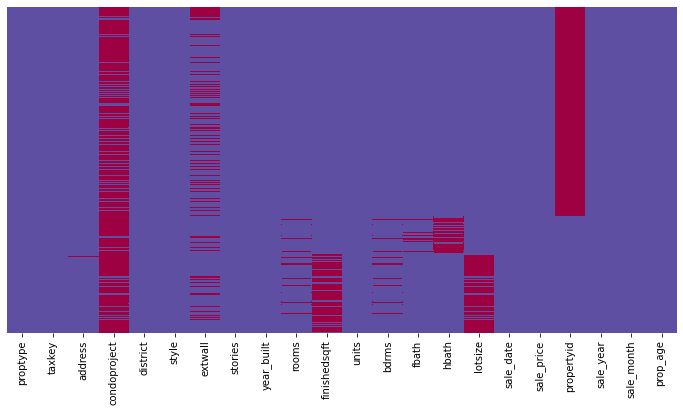

In [ ]:
plt.figure(figsize=(12,6))
sns.heatmap(df.isnull(),yticklabels=False,cbar=False,cmap='Spectral_r');

* propertyid has 83.14% & condoproject has 96.17% missing values. Delete them.
* address is not needed for the model.


In [ ]:
df.drop(labels='condoproject', axis=1, inplace=True)
df.drop(labels='propertyid', axis=1, inplace=True)

# Address is not needed for the model.
df.drop(labels='address', axis=1, inplace=True)

# Delete rows with missing finishesqft & lotsize.
#df = df[pd.notnull(df['finishedsqft'])].reset_index(drop=True)
#df = df[pd.notnull(df['lotsize'])].reset_index(drop=True)

print(df.shape)

(52875, 19)


Check for presence of typos or double entries in categorical feature values.

In [ ]:
str_cols = df.columns[df.dtypes==object]
for col in str_cols:
  print(df[col].value_counts(normalize =True)) 

Residential      0.752104
Condominium      0.154374
Commercial       0.061231
Lg Apartment     0.031874
Manufacturing    0.000208
Vacant Land      0.000132
Exempt           0.000076
Name: proptype, dtype: float64
5.360559e+09    0.000303
4.611469e+09    0.000151
3.030830e+09    0.000113
4.360312e+09    0.000113
3.210759e+09    0.000113
                  ...   
5.980013e+09    0.000019
4.320700e+09    0.000019
4.331316e+09    0.000019
4.310217e+09    0.000019
7.160369e+09    0.000019
Name: taxkey, Length: 42006, dtype: float64
5.0     0.123636
11.0    0.111021
14.0    0.092202
10.0    0.090386
3.0     0.088306
13.0    0.088249
4.0     0.063719
9.0     0.059709
2.0     0.056551
7.0     0.045430
6.0     0.044181
1.0     0.043709
12.0    0.034990
8.0     0.032039
15.0    0.025873
Name: district, dtype: float64
Ranch                                                 0.219751
Cape Cod                                              0.149048
APARTMENT                                             0.

From the above, notice there are multiple entries for the same value due to typos in both extwall and style variables.

**Fix the multiple entries in extwall & style.**

In [ ]:
# Fix typos in extwall.

pd.options.display.max_rows = None
df['extwall'] = df['extwall'].replace({'Aluminum / Vinyl':'Aluminum/Vinyl', 
                                       'Alum/Vynyl Siding':'Aluminum/Vinyl', 
                                       'Masonry / Frame':'Masonry/Frame', 
                                       'Masonary Frame':'Masonry/Frame',
                                       'Precast Masonary':'Masonry/Frame',
                                       'Fiber Cement/Hardiplank':'Fiber-Cement'})
print(df['extwall'].value_counts(normalize=True, dropna=False))

Aluminum/Vinyl    0.436028
NaN               0.224511
Brick             0.177759
Frame             0.053352
Stone             0.026459
Masonry/Frame     0.023943
Asphalt/Other     0.016738
Stucco            0.013069
Wood              0.011404
Fiber-Cement      0.005939
Block             0.004407
Concrete Block    0.003537
Prem Wood         0.001986
Other             0.000416
Metal Siding      0.000246
Brick on Block    0.000151
Brick on Frame    0.000057
Name: extwall, dtype: float64


Fix the multiple entries in style.
Place entries into broader categories to decrease number of unique entries and fix typos.
Reference: https://stackoverflow.com/questions/41476150/removing-space-from-columns-in-pandas

In [ ]:
df.loc[df['style'].str.contains('Apartment:', case=False, na=False), 'style'] = 'apartment building'
df.loc[df['style'].str.contains('Apartments -', case=False, na=False), 'style'] = 'apartment building'

df['style'] = df['style'].astype(str).str.lower()
df['style'] = df['style'].replace({'ap1 (conventional apt with 4-6 units)':'apartment building', 
                                           'ap2 (conventional apt with 7-11 units)':'apartment building', 
                                           'ap3 (conventional apt with 12-20 units)':'apartment building', 
                                           'ap4 (conv apt with 21 or more units)': 'apartment building',
                                           'apartment-mix':'apartment',
                                           'subsidized apartments':'apartment building',
                                           'apartment  - mix':'apartment',
                                           'apartments - 8 or more units':'apartment building',
                                           'ap 1':'apartment building',
                                           'multiple residential bldgs':'apartment building',
                                           'apartmenmt':'apartment',
                                           'apartment- mix':'apartment',
                                           'aparment':'apartment',
                                           'apartment ':'apartment',
                                           'townhouse apartment':'apartment',
                                           'condo':'apartment',
                                           '`apartment':'apartment',
                                           'garden style ':'apartment',
                                           'garden style':'apartment',
                                           'condo bi/tri level':'apartment',
                                           'split level':'mixed styles',
                                           'bilevel':'mixed styles',
                                           'trilevel':'mixed styles',
                                           'bi-tri':'mixed styles',
                                           'bi/tri':'mixed styles',
                                           'mixed':'mixed styles',
                                           'mixed ':'mixed styles',
                                           'bi-level':'mixed styles',
                                           'dplx bungalow':'duplex',
                                           'duplex o/s':'duplex',
                                           'condo duplex':'duplex',
                                           'duplex old/style':'duplex',
                                           'duplex n/s':'duplex',
                                           'duplex-cottage':'duplex',
                                           'duplex - cottage':'duplex',
                                           'duplex/other':'duplex',                                            
                                           'condo duplex':'duplex',
                                           'old style duplex':'duplex',
                                           'town house':'house',
                                           'condo townhouse':'house',
                                           'townhse':'house',
                                           'condo ranch':'house',
                                           'townhouse':'house',
                                           'pole building':'house',
                                           'hi-rise':'high rise > 12 stories',
                                           'high rise> 12 stories':'high rise > 12 stories',
                                           'hi rise':'high rise > 12 stories',
                                           'high rise':'high rise > 12 stories',
                                           'hirise':'high rise > 12 stories',
                                           'warehouse building - 1 story':'warehouse',
                                           'bulk storage':'warehouse',
                                           'office warehouse park - multi tenants':'warehouse',
                                           'mini warehouse':'warehouse',
                                           'multi story warehouse':'warehouse',
                                           'mixed':'mixed styles',
                                           'store & apt, store & o':'store building',
                                           'store & apt, store & ofc, 1 story':'store building',
                                           'store building - single tenant, 1 story':'store building',
                                           'store building - multiple tenants':'store building',
                                           'store bldg - multi story (store & apt, store & o':'store building',
                                           'store bldg - multi story (store & apt, store & ofc':'store building',
                                           'single tenant multi story retail':'store building',
                                           'beer depot & liquor store':'store building',
                                           'office building - multi story ( ofc & apt)':'office building',
                                           'office building - 1 story':'office building',
                                           'office building - class b':'office building',
                                           'office building - class c':'office building',
                                           'office building - class a':'office building',
                                           'office building - class d':'office building',
                                           'svs station w conv store':'auto service/other',
                                           'svc station w conv and carwash':'auto service/other',
                                           'svc station w conv, retail, restaurant and carwa':'auto service/other',
                                           'svc station wo conv store':'auto service/other',
                                           'svc station w conv, carwash, and restaurant':'auto service/other',
                                           'svc station w conv and restaurant':'auto service/other',
                                           'service building':'auto service/other',
                                           'used car sale':'auto service/other',
                                           'car dealer, truck dealer':'auto service/other',
                                           'auto & auto body repair':'auto service/other',
                                           'auto rental agency':'auto service/other',
                                           'quick oil change':'auto service/other',
                                           'muffler shop':'auto service/other',
                                           'car wash':'auto service/other',
                                           'tire dealer':'auto service/other',
                                           'salvage yard':'auto service/other',
                                           'service station':'auto service/other',
                                           'rm or rooming house':'hotel/other',
                                           'r/m (res. multiple) or rooming house':'hotel/other',
                                           'rooming house - 8 or more units':'hotel/other',
                                           'hotel limited service':'hotel/other',
                                           'hotel select service':'hotel/other',
                                           'hotel extended stay':'hotel/other',
                                           'motel':'hotel/other',
                                           'motel style':'hotel/other',
                                           'hotel - limited service':'hotel/other',
                                           'parking garage':'parking garage/other',
                                           'mobile home parks':'parking garage/other',
                                           'parking garage, parking ramp':'parking garage/other',
                                           'trucking terminal':'parking garage/other',
                                           'parking lot':'parking garage/other',
                                           'commercial garage/other':'parking garage/other',
                                           'parking garage/other ':'parking garage/other',
                                           'strip shopping center':'shopping center',
                                           'super market':'shopping center',
                                           'discount department store':'shopping center',
                                           'super regional shopping center':'shopping center',
                                           'residence with commercial usage':'commercial indoor other',
                                           'commercial land':'commercial land other',
                                           'commercial exempt':'commercial land other',
                                           'laundry pick-up station': 'commercial indoor other',
                                           'mansions with commercial usage' :'mansion',
                                           'laundromat' : 'commercial indoor other',
                                           'lumber yards':'commercial land other',
                                           'medical clinic':'health facility',
                                           'licensed res care facility,  halfway house, etc.':'health facility',
                                           'nursing home':'health facility',
                                           'pharmacy':'health facility',
                                           'sport, health & recreational properties':'health facility',
                                           'sit down restaurant':'food service',
                                           'fast food operation':'food service',
                                           'custard stand, drive-in':'food service',
                                           'tavern':'food service',
                                           'residence o/s': 'house',
                                           'res o/s 1 story': 'house',   
                                           'ranch':'house',
                                           'residence old/style':'house',
                                           'res o/s a & 1/2':'house',
                                           'residence o/s 2sty+':'house',
                                           'colonial':'house',
                                           'cottage':'house',
                                           'tudor':'house',
                                           'townhouse':'house',
                                           'cape cod':'house',
                                           'row house':'house',                
                                           'milwaukee bungalow':'house',
                                           'contemporary':'house',
                                           'day care center':'educational facility',
                                           'school':'educational facility',
                                           'neighborhood center':'indoor public and cultural facility',
                                           'theater':'indoor public and cultural facility',
                                           'funeral home':'indoor public and cultural facility',
                                           'supper club':'indoor public and cultural facility',
                                           'bowling alley':'indoor public and cultural facility',
                                           'food service':'indoor public and cultural facility',
                                           'church':'indoor public and cultural facility',
                                           'shopping center':'indoor public and cultural facility',
                                           'bank, savings & loan':'financial facility',
                                           'post office, social security building':'government building',
                                           '150700 ':'other',
                                           '303':'other',
                                           '1':'other',
                                           '810':'other',
                                           '6242010':'other',
                                           '303':'other',
                                           'unkwn':'other',
                                           'special - to use this code see supv.':'other',
                                           "63,500 for '09. unf.":'other',
                                           '150700':'other',
                                           ' ':'other'
                                           })
#df['style'] = df['style'].str.replace(' ', '_')
print(df['style'].value_counts(normalize=True, dropna=False))

house                                                 0.618005
duplex                                                0.141920
apartment                                             0.068993
apartment building                                    0.034704
store building                                        0.023773
mid rise 4-12 stories                                 0.019329
mixed styles                                          0.014695
high rise > 12 stories                                0.014336
low rise 1-3 stories                                  0.012690
warehouse                                             0.010326
auto service/other                                    0.007811
triplex                                               0.007754
food service                                          0.006600
office building                                       0.005201
hotel/other                                           0.003329
mansion                                               0

Since the entries in style were changed to lower case letters, np.nan became string 'nan'. Need to change it back to np.nan before filling up all null values.

In [ ]:
df['style'].replace('nan', np.NaN, inplace=True);


Fill in the missing values according to the distribution of the present values for each variable. For code reference:
https://stackoverflow.com/questions/34913590/fillna-in-multiple-columns-in-place-in-python-pandas

In [ ]:
for col in ['proptype', 'district', 'style', 'extwall', 'stories', 'rooms', 'bdrms', 'hbath', 'fbath', 'lotsize', 'finishedsqft']:
  col_prob=df[col].value_counts(normalize =True)
  df[col] = df[col].fillna(pd.Series(np.random.choice(col_prob.index, p=col_prob, size=len(df))))

Check if there is any empty entry left in the data.

In [ ]:
df.isnull().values.any()

False

All entries have valid values! 


## Data Visualization
In this section:
* include data only from 2009-2021 in the further analysis due to 2002-2008 recorded data not having single household dwellings recorded properly as seen below
* visualize & run statistical analysis of target, numerical and categorical variables
* for numerical variables: generate correlation matrix, interpret and discard nuerical variables as necessary
* for categorical variables, use the visualization to determine their possible effect on the target variable

First, check the mean sale price over the years.

In [ ]:
# compute the yearly averages
df_avg = df.groupby(df.sale_year, as_index=True)['sale_price'].mean()
fig = px.bar(df_avg, x = df_avg.index, y = df_avg, color=df_avg, title='Average Sale Price over the Years',
labels = {'sale_price' : ' Sale Price', 'sale_year' : 'Year'})
fig.show()

Notice the average price discrimination for years 2003-2008 (\$ 449,000-1,190,000) vs 2009-2021 ( \$167,000-227,000). Quite a big difference!
 Now, look at the sale count for each sale year.

In [ ]:
df_bar=df[['sale_year', 'sale_price']].groupby(by='sale_year').count().sort_values(by='sale_year', ascending=True).reset_index()
df_bar.columns.values[1]='sale_count'
fig = px.bar(df_bar, x='sale_year', y = 'sale_count', color='sale_count', title='Number of Sales per Year',
labels = {'sale_count' : ' Sale Count', 'sale_year' : 'Year'})
fig.show()

There is a considerable difference in sale count for 2002-2008 (128-368 sales) vs 2009-2021 (1728-6470 sales). It would make sense that for 2002-2008 the prices higher (maybe due to financial recession), therefore number of sales are much less for those years versus 2009-2021. However, the *difference is too large*. 
Dig deeper and look at the table of number of sales according to the estate style was sold.
Code reference: https://stackoverflow.com/questions/33271098/python-get-a-frequency-count-based-on-two-columns-variables-in-pandas-datafra

In [ ]:
h=pd.crosstab(df['style'],df['sale_year'])
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
  print(h)

sale_year                                           2002.0  2003.0  2004.0  2005.0  2006.0  2007.0  2008.0  2009.0  2010.0  2011.0  2012.0  2013.0  2014.0  2015.0  2016.0  2017.0  2018.0  2019.0  2020.0  2021.0
style                                                                                                                                                                                                             
apartment                                                0       1       0       1       1       1       0     273     184     226     247     361     390     417     493     504     514      19       7      10
apartment building                                       5       9      15      27      30      17      13      12      16      48      56      84      94     125     147     149     186     352     203     247
auto service/other                                      21      29      26      59      36      24      17       5       5       8      13      13      15  

There is a dramatic decrease in number of apartment, duplex, house, highrise and mixed style sales for years 2002-2008 vs 2009-2021 according to the table above.

The only possible explanation is improper recording of these sales transactions (less than 5 apartment unit sales in a big city of Milwaukee over 7 years is not realistic). Hence, we will only work with data for years 2009-2021 to avoid bias.

In [ ]:
# Delete data for sale years for 2002-2008.

df = df[(df["sale_year"] >=2009)].reset_index(drop=True)
len(df)

51229

**Visualization & statistical analysis of the target variable, sale price.**

In [ ]:
# Sale price distribution

fig = px.box(df, x="sale_price", title='Distribution of Sale Price in USD', labels = {'sale_price' : 'Sale Price'})
fig.show()

From above box plot, it is evident that sale price is quite spread out after $18,5 million, understandably so. Now consider, cumulative percentage of properties according to price.

In [ ]:
plt.figure(figsize=(15,6))
x = df[['sale_price']].sort_values(by='sale_price').reset_index()
x['property_proportion'] = 1
x['property_proportion'] = x['property_proportion'].cumsum()
x['property_proportion'] = 100* x['property_proportion'] / len(x['property_proportion'])

fig = px.scatter(x, y='sale_price', x='property_proportion', color='property_proportion', title='Cumulative Percentage of Properties according to Price', 
                 labels={'sale_price' : 'Sale Price', 'property_proportion' : 'Percentage of Properties in ascending order of Price'})
fig.update_traces(marker_size=10)
fig.show()

<Figure size 1080x432 with 0 Axes>

Similar observations as in boxplot. After few iterations of the prediction model, $6 million mark was chosen, since it yielded better predictive model results while still keeping over 99.8% of the data. There is too little observations after that mark and are quite widespread, which may be general case with real estate data. Remove observations that fall outside that mark and reassess.

In [ ]:
# Remove observations that fall outside those caps
df2 = df[(df['sale_price'] <= 6000000)].reset_index(drop=True)
len(df2)

51137

In [ ]:
# Updated sale price boxplot
fig = px.box(df2, x="sale_price", title='Distribution of Sale Price in USD', labels = {'sale_price' : 'Sale Price'})
fig.show()

Target variable is right skewed

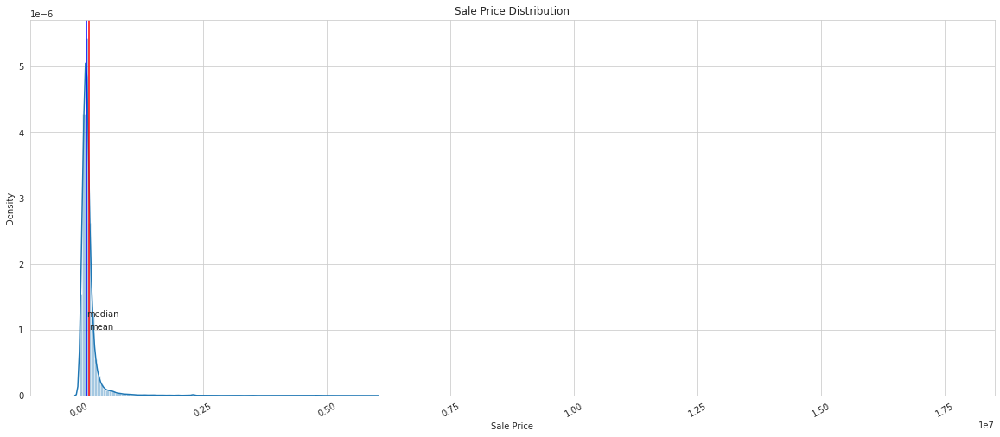

In [ ]:
# Sale price density

import matplotlib.ticker as ticker
sns.set_style("whitegrid")
plt.figure(figsize=(20,8))

plotd = sns.distplot(df2['sale_price'], kde=True, bins=100)

tick_spacing=2500000
plotd.xaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))
plotd.set_xlim([-1000000,18500000])
plt.xticks(rotation=30)
plt.axvline(df2['sale_price'].mean(), c='red')
plt.axvline(df2['sale_price'].median(), c='blue')
plt.text(df2['sale_price'].median(),0.0000012, "median")
plt.text(df2['sale_price'].mean(),0.0000010, "mean")
plt.xlabel('Sale Price')
plt.title('Sale Price Distribution')
plt.show()

In [ ]:
# Updated cumulative percentage of Properties according to Price

plt.figure(figsize=(15,6))
x = df[['sale_price']].sort_values(by='sale_price').reset_index()
x['property_proportion'] = 1
x['property_proportion'] = x['property_proportion'].cumsum()
x['property_proportion'] = 100* x['property_proportion'] / len(x['property_proportion'])

fig = px.scatter(x, y='sale_price', x='property_proportion', color='property_proportion', title='Updated Cumulative Percentage of Properties according to Price', 
                 labels={'sale_price' : 'Sale Price', 'property_proportion' : 'Percentage of Properties in ascending order of Price'})
fig.update_traces(marker_size=10)
fig.show()

<Figure size 1080x432 with 0 Axes>

**Analyze the numerical features and their relationship with the target variable.**

Boxplot of finished sqft.

In [ ]:
fig = px.box(df2, x="finishedsqft", title = 'Distribution of FinisheSqFt', labels = {'finishedsqft' : 'Finished SqFt'})
fig.show()

Relationship of sale price & number of bedrooms.

In [ ]:
fig = px.scatter(df2, y='sale_price', x='bdrms', color='bdrms', title = 'Sale Price by Number of Bedrooms ', 
                 labels = {'sale_price' : 'Sale Price', 'bdrms' : 'Bedrooms'})
fig.update_traces(marker_size=5)
fig.show()

Remove one outlier (bdrm=2031 for sale price~ $ 64,000)

In [ ]:
df2=df2[df2['bdrms'] < 2031].reset_index(drop=True)

In [ ]:
# Boxplot of sale price by number of bedrooms.
fig = px.box(df2, x='bdrms', y='sale_price', title = 'Sale Price Range by Number of Bedrooms ', color='bdrms', 
             labels = {'sale_price' : 'Sale Price', 'bdrms' : 'Bedrooms'})
fig.show()

Relationship of sale price & number of units.

In [ ]:
fig = px.scatter(df2, y='sale_price', x='units', color='units', title = 'Sale Price by Number of Units ', 
                 labels = {'sale_price' : 'Sale Price', 'units' : 'Units'})
fig.update_traces(marker_size=5)
fig.show()

 Remove 1 outlier, with more than 150 units and 325K low price. 

In [ ]:
df2=df2[df2['units'] != 150].reset_index(drop=True)

In [ ]:
# Sale price by months

months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
colors = ['hsl('+str(h)+',50%'+',50%)' for h in np.linspace(0, 360, 12)]
data = [{'y' : df2.sale_price[df2.sale_month == ind],'type':'box', 'name' : months[ind - 1], 'marker':{'color': colors[ind - 1]}
} for ind in range(1,13)]

layout = go.Layout( title='Sale Price Range by Months', xaxis=dict(title='Month'), yaxis=dict(title='Sale Price'))

fig = go.Figure(data=data, layout=layout)
# #dat = [trace0, trace1, trace2, trace3, trace4]
py.iplot(fig)

In [ ]:
# Sale count by months

df_pie=df[['sale_month', 'sale_price']].groupby(by='sale_month').count().sort_values(by='sale_month', ascending=True).reset_index()
df_pie.columns.values[1]='sale_count'
fig = px.pie(df_pie, values='sale_count', names=months, title='Percentage of Sales per Sale Month')
fig.update_layout(margin=dict(t=0, b=0, l=0, r=0))
fig.show()

Most sales were in May-June months, and least in December-February.  

Finally, compute correlation coefficients for numerical variables and drop the ones which have 

*   low correlation (<0.05) with sale price
*   have high correlation (>0.5) with other independent variables. 

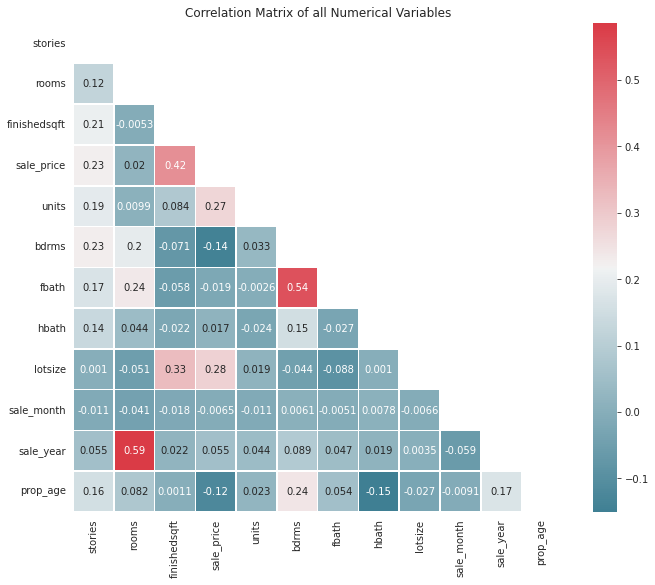

In [ ]:
# Compute the correlation matrix

d= df2[['stories','rooms','finishedsqft', 'sale_price','units', 'bdrms', 'fbath', 'hbath', 'lotsize', 'sale_month', 'sale_year','prop_age']]
corr = d.corr()

# Generate a mask for the upper triangle
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, 
            square=True, linewidths=.5, annot=True, cmap=cmap)
plt.yticks(rotation=0)
plt.title('Correlation Matrix of all Numerical Variables')
plt.show()

From above,
 
*   rooms has high correlation (0.59) with sale_year and very low correlation (0.0021) with sale price. 
*   sale_year has higher correlation compared to rooms with sale_price (0.054) as well.
*   fbath has high correlation (0.54) with bdrms and low correlation (-0.0015) with sale price.
*   bdrms has higher correlation (-0.14) with sale price.
*   sale_month (-0.0056) & hbath (0.0016) have low correlation with sale price.

fbath, sale_month & hbath will not be included in the prediction model. Get the pairplot for rest of numerical variables.

<Figure size 432x288 with 0 Axes>

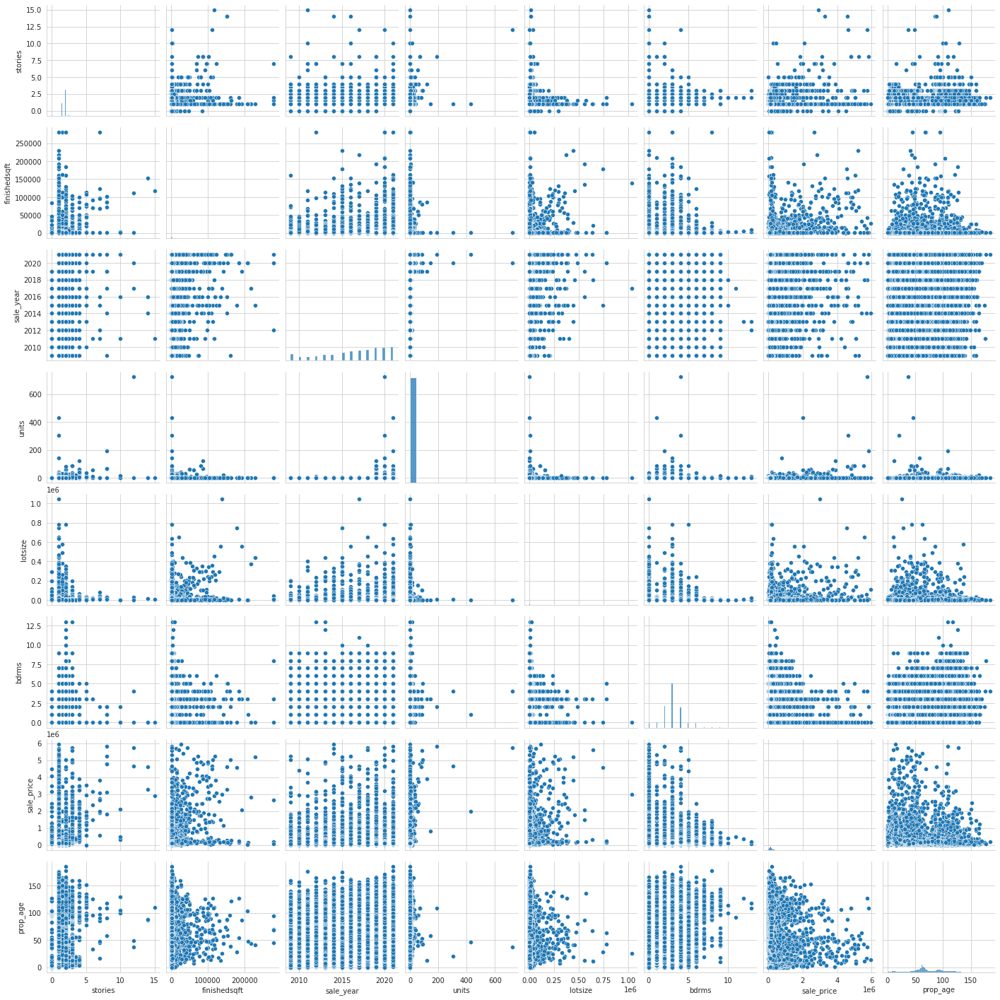

None

In [ ]:
columns = ['stories','finishedsqft', 'sale_year', 'units', 'lotsize', 'bdrms', 'sale_price', 'prop_age']
df_num = df2.loc[:,columns]
plt.figure()
sns.pairplot(df_num)
display(plt.show())

**Analyze the categorical features and their relationship with the target variable.**

Sale price distribution by property type.

In [ ]:
fig = px.box(df2, y='sale_price', x='proptype', color='proptype', title = 'Sale Price Range by Property Type ', 
             labels = {'sale_price' : 'Sale Price', 'proptype' : 'Property Type'})
fig.update_traces(marker_size=5)
fig.show()

Observe definite effect of property type on sale price. Manufacturing is most expensive followed by Commercial, least expensive is Vacant Land. Keep the propertyid in the prediction model.

Sale price distribution by type of exterior wall.

In [ ]:
fig = px.box(df2, y='sale_price', x='extwall', color='extwall', title = 'Sale Price Range by Type of Exterior Wall ', 
             labels = {'sale_price' : 'Sale Price', 'extwall' : 'Type of Exterior Wall'})
fig.update_traces(marker_size=5)
fig.show()

Some price difference according to type of exterior wall the properties have. Brick on Frame is the most expensive. Hence, keep extwall in the prediction model.
Now, look at effect property style on sale price.

In [ ]:
fig = px.box(df2, y='sale_price', x='style', color='style', title = 'Sale Price Range by Property Style', 
             labels = {'sale_price' : 'Sale Price', 'style' : 'Property Style'})
fig.update_layout(
    autosize=False,
    width=1500,
    height=600)
fig.show()

In [ ]:
df_pie=df[['style', 'sale_price']].groupby(by='style').count().sort_values(by='style', ascending=True).reset_index()
df_pie.columns.values[1]='sale_count'
fig = px.pie(df_pie, values='sale_count', names='style', title='Percentage of Sales per Property Style')
fig.update_layout(margin=dict(t=0, b=0, l=0, r=0))
fig.show()

Health Facilities are most pricy, while houses are least. There is obvious price difference depending on property style. Thus, include style in prediction model.
Boxplot of sale price by district ( districts 1 to 15).

In [ ]:
fig = px.box(df2, y='sale_price', x='district', color='district', title = 'Sale Price Range by District', 
             labels = {'sale_price' : 'Sale Price', 'district' : 'District'})
fig.update_traces(marker_size=5)
fig.show()

District 4 is most expensive, while district 15 is the most affordable. Look at the sale price by district over the years, to check if there is a trend.

In [ ]:
fig = px.histogram(df2, y='sale_price', x='sale_year', color='district', histfunc='avg', title = 'Sale price by District from 2009-2021', labels = {'sale_price' : 'Sale Price', 'sale_year' : 'Sale Year'})
fig.show()

The price pattern for each diistrict is similar for each year. Now calculate sales count per district.

In [ ]:
df_barr=df[['district', 'sale_price']].groupby(by='district').count().sort_values(by='district', ascending=True).reset_index()
df_barr.columns.values[1]='sale_count'
fig = px.bar(df_barr, x='district', y = 'sale_count', color='sale_count', title='Number of Sales per District from 2009-2021',
labels = {'sale_count' : ' Sale Count', 'district' : 'District'})
fig.show()

District 5 had most number of sales, while district 15 least. There is difference in property prices & number of sales dependending on the district. Include district in the model.
Now, look at the average finished sqft by district.

In [ ]:
d3 = pd.DataFrame(df2.groupby(['district']).mean()).reset_index()
total = d3['finishedsqft'].sum()
trace0 = go.Scatter( x=d3.district, y=d3['finishedsqft'], mode='markers', 
    marker=dict(size=[((x/total)*500) for x in d3['finishedsqft']], color=d3['finishedsqft'], colorscale="Viridis") )

data = [trace0]
layout = go.Layout(title='Average Finished SqFt of Properties in Each District', 
    xaxis=dict(title='District' ), yaxis=dict(title='Finished SqFt'),)

fig = go.Figure(data=data, layout=layout)
py.iplot(fig)

Districts 12, 4 and 9 have the most finished sqft, while districs 5, 11 and 14 have the least. 

## Predictive Modeling
* Convert categorical variables into dummy (numerical) variables
* Standardize both target & independent numerical variables and take their log to help with skewness of target variable
* Run suitable algorithms

Include the features to the prediction model that displayed stronger relationship with sale price according to the above analysis. 

In [ ]:
columns = ['district', 'proptype', 'style', 'extwall', 'stories', 'lotsize', 'finishedsqft', 'units', 'bdrms', 'sale_price', 'prop_age', 'sale_year']
df_model = df2.loc[:,columns]

**Feature engineering.**

Select the categorical variables to be one-hot encoded before using them in the model. Through number of iterations, including all categorical variables yielded the better results than any other possible combination.

In [ ]:
one_hot_features = ['district', 'proptype', 'style', 'extwall']

# For each categorical column, find the unique number of categories i.e number of columns being added to the dataset.
longest_str = max(one_hot_features, key=len)
total_num_unique_categorical = 0
for feature in one_hot_features:
    num_unique = len(df2[feature].unique())
    print('{col:<{fill_col}} : {num:d} unique categorical values.'.format(col=feature, fill_col=len(longest_str), num=num_unique))
    total_num_unique_categorical += num_unique
print('{total:d} columns will be added during one-hot encoding.'.format(total=total_num_unique_categorical))

district : 15 unique categorical values.
proptype : 7 unique categorical values.
style    : 27 unique categorical values.
extwall  : 16 unique categorical values.
65 columns will be added during one-hot encoding.


Convert categorical variables into dummy/indicator variables (i.e. one-hot encoding).

In [ ]:
one_hot_encoded = pd.get_dummies(df_model[one_hot_features])
one_hot_encoded.info(verbose=True, memory_usage=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51135 entries, 0 to 51134
Data columns (total 51 columns):
 #   Column                                                    Non-Null Count  Dtype  
---  ------                                                    --------------  -----  
 0   district                                                  51135 non-null  float64
 1   proptype_Commercial                                       51135 non-null  uint8  
 2   proptype_Condominium                                      51135 non-null  uint8  
 3   proptype_Exempt                                           51135 non-null  uint8  
 4   proptype_Lg Apartment                                     51135 non-null  uint8  
 5   proptype_Manufacturing                                    51135 non-null  uint8  
 6   proptype_Residential                                      51135 non-null  uint8  
 7   proptype_Vacant Land                                      51135 non-null  uint8  
 8   style_apartment 

In [ ]:
#Delete the old columns...
df_model = df_model.drop(one_hot_features, axis=1)

#...and add the new one-hot encoded variables
df_model = pd.concat([df_model, one_hot_encoded], axis=1)
df_model.head()

,stories,lotsize,finishedsqft,units,bdrms,sale_price,prop_age,sale_year,district,proptype_Commercial,proptype_Condominium,proptype_Exempt,proptype_Lg Apartment,proptype_Manufacturing,proptype_Residential,proptype_Vacant Land,style_apartment,style_apartment building,style_auto service/other,style_billboard,style_commercial indoor other,style_commercial land other,style_duplex,style_educational facility,style_financial facility,style_food service,style_health facility,style_high rise > 12 stories,style_hotel/other,style_house,style_indoor public and cultural facility,style_low rise 1-3 stories,style_mansion,style_mid rise 4-12 stories,style_mixed styles,style_office building,style_other,style_parking garage/other,style_shopping center,style_store building,"style_svc station w conv, retail, restaurant and carwash",style_triplex,style_warehouse,extwall_Aluminum/Vinyl,extwall_Asphalt/Other,extwall_Block,extwall_Brick,extwall_Brick on Block,extwall_Brick on Frame,extwall_Concrete Block,extwall_Fiber-Cement,extwall_Frame,extwall_Masonry/Frame,extwall_Metal Siding,extwall_Other,extwall_Prem Wood,extwall_Stone,extwall_Stucco,extwall_Wood
0,1.0,5838.0,1188.0,1.0,2.0,103000.0,71.0,2009.0,1.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
1,1.0,4797.0,1054.0,1.0,3.0,73450.0,58.0,2009.0,1.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,1.0,5040.0,998.0,1.0,3.0,90000.0,59.0,2009.0,1.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,1.0,4800.0,988.0,1.0,3.0,63300.0,58.0,2009.0,1.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,2.0,5945.0,1470.0,1.0,3.0,107500.0,5.0,2009.0,1.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


The sale price is right skewed. Need to standardize (mean=0, variance=1) before including in the model to give better results. 

In [ ]:
# Skewness of sale price

df2['sale_price'].skew()

9.813527064591586

In [ ]:
# Transform the sale_price by taking its log and standardizing it
scaler = StandardScaler()
k=np.log(df2['sale_price']).values.reshape(-1,1)
scaler.fit(k)
df_model['sale_price'] = StandardScaler().fit_transform(k)


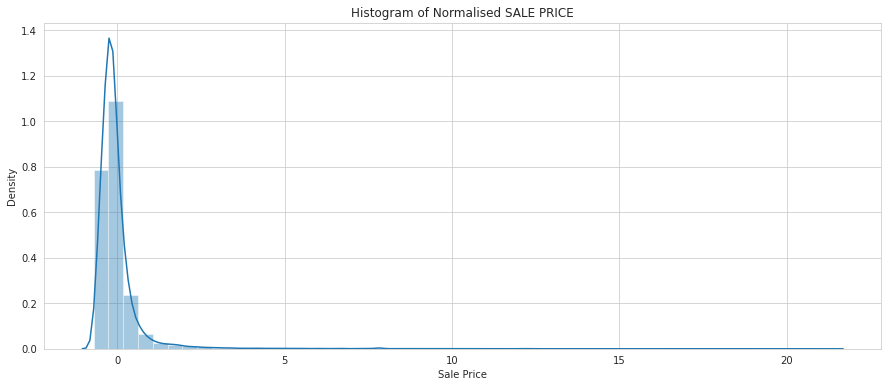

In [ ]:
b=StandardScaler().fit_transform(df2['sale_price'].values.reshape(-1,1))
plt.figure(figsize=(15,6))
sns.distplot(b)
plt.title('Histogram of Normalised SALE PRICE')
plt.xlabel('Sale Price')
plt.show()

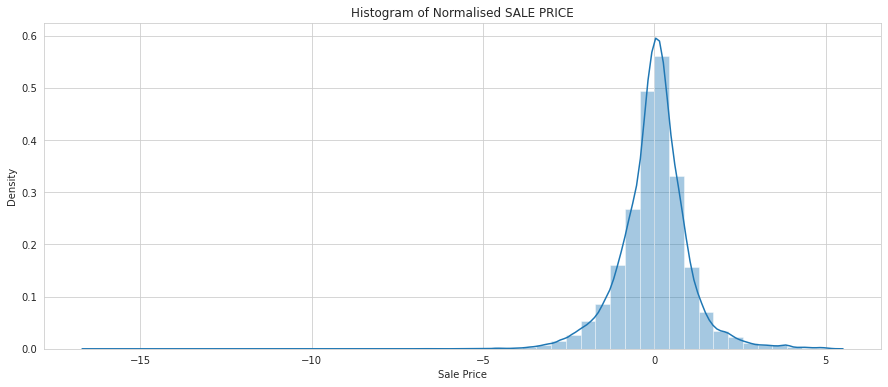

In [ ]:
# Plot the updated histogram of sale price

plt.figure(figsize=(15,6))
sns.distplot(df_model['sale_price'])
plt.title('Histogram of Normalised SALE PRICE')
plt.xlabel('Sale Price')
plt.show()

In [ ]:
df_model.describe()

,stories,lotsize,finishedsqft,units,bdrms,sale_price,prop_age,sale_year,district,proptype_Commercial,proptype_Condominium,proptype_Exempt,proptype_Lg Apartment,proptype_Manufacturing,proptype_Residential,proptype_Vacant Land,style_apartment,style_apartment building,style_auto service/other,style_billboard,style_commercial indoor other,style_commercial land other,style_duplex,style_educational facility,style_financial facility,style_food service,style_health facility,style_high rise > 12 stories,style_hotel/other,style_house,style_indoor public and cultural facility,style_low rise 1-3 stories,style_mansion,style_mid rise 4-12 stories,style_mixed styles,style_office building,style_other,style_parking garage/other,style_shopping center,style_store building,"style_svc station w conv, retail, restaurant and carwash",style_triplex,style_warehouse,extwall_Aluminum/Vinyl,extwall_Asphalt/Other,extwall_Block,extwall_Brick,extwall_Brick on Block,extwall_Brick on Frame,extwall_Concrete Block,extwall_Fiber-Cement,extwall_Frame,extwall_Masonry/Frame,extwall_Metal Siding,extwall_Other,extwall_Prem Wood,extwall_Stone,extwall_Stucco,extwall_Wood
count,51135.000000,5.113500e+04,51135.000000,51135.000000,51135.000000,5.113500e+04,51135.000000,51135.000000,51135.000000,51135.000000,51135.000000,51135.000000,51135.000000,51135.000000,51135.000000,51135.000000,51135.000000,51135.000000,51135.000000,51135.000000,51135.000000,51135.000000,51135.000000,51135.000000,51135.000000,51135.000000,51135.000000,51135.000000,51135.000000,51135.000000,51135.000000,51135.000000,51135.000000,51135.000000,51135.000000,51135.000000,51135.000000,51135.000000,51135.000000,51135.000000,51135.000000,51135.000000,51135.000000,51135.000000,51135.000000,51135.000000,51135.000000,51135.000000,51135.000000,51135.000000,51135.000000,51135.000000,51135.000000,51135.000000,51135.000000,51135.000000,51135.000000,51135.000000,51135.000000
mean,1.336247,6.139363e+03,2108.683739,1.352948,3.006395,-5.002354e-16,71.547981,2016.497996,8.037978,0.032835,0.159499,0.000078,0.030547,0.000196,0.776748,0.000098,0.071282,0.033011,0.003911,0.000039,0.000939,0.000137,0.146495,0.000508,0.000313,0.003579,0.001056,0.014804,0.003031,0.638486,0.000430,0.013122,0.001858,0.019986,0.015176,0.002660,0.000508,0.000391,0.001017,0.012359,0.000020,0.007959,0.006923,0.562980,0.021336,0.005808,0.228943,0.000215,0.000059,0.004302,0.007725,0.068740,0.030605,0.000293,0.000528,0.002660,0.034673,0.016642,0.014491
std,0.520638,1.672316e+04,6517.480450,4.514441,1.319445,1.000010e+00,30.223969,3.584711,4.180563,0.178205,0.366145,0.008844,0.172087,0.013983,0.416430,0.009888,0.257298,0.178666,0.062418,0.006254,0.030624,0.011699,0.353605,0.022544,0.017686,0.059716,0.032480,0.120769,0.054973,0.480444,0.020738,0.113799,0.043063,0.139954,0.122252,0.051503,0.022544,0.019773,0.031873,0.110485,0.004422,0.088860,0.082916,0.496022,0.144502,0.075990,0.420157,0.014665,0.007659,0.065452,0.087551,0.253013,0.172247,0.017125,0.022973,0.051503,0.182952,0.127928,0.119505
min,0.000000,0.000000e+00,0.000000,0.000000,0.000000,-1.635670e+01,0.000000,2009.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,3.440000e+03,1020.000000,1.000000,2.000000,-4.764102e-01,55.000000,2014.000000,4.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,

Need to transform independent variables by taking their log as well to be compatible with updated target variable.  From above statistics, all of them have 0's in them. Thefore, add 1 before taking the log.

In [ ]:
# Add 1 to independent variables, take their log and standardize them.
for col in ['stories', 'units', 'bdrms', 'prop_age', 'sale_year', 'lotsize', 'finishedsqft']:
  df_model[col] = StandardScaler().fit_transform(np.log(df_model[col]+1).values.reshape(-1,1))
  


Split data into training (80%) and testing (20%) sets

In [ ]:
training, testing = train_test_split(df_model, test_size=0.2, random_state=0)
print("Total sample size = %i; training sample size = %i, testing sample size = %i"\
     %(df_model.shape[0],training.shape[0],testing.shape[0]))

Total sample size = 51135; training sample size = 40908, testing sample size = 10227


Split the training and testing sets into set of independent (X) features and dependent/target feature (y).

In [ ]:
df_train_s = training.loc[:,df_model.columns]
X_train = df_train_s.drop(['sale_price'], axis=1)
y_train = df_train_s.loc[:, ['sale_price']]

df_test_s = testing.loc[:,df_model.columns]
X_test = df_test_s.drop(['sale_price'], axis=1)
y_test = df_test_s.loc[:, ['sale_price']]

# X are the independent variables/features that help predict y, sale price. This is done for both training and testing sets.

**Suitable Predictive Methods**

In [ ]:
lm = LinearRegression()
lgbm = lightgbm.LGBMRegressor(random_state = 42)
mlp = MLPRegressor(random_state = 42)
ridge = Ridge(random_state = 42)
lasso = Lasso(random_state = 42)
knn = KNeighborsRegressor()
rf = RandomForestRegressor(random_state = 42)
xgbt = xgb.XGBRegressor(random_state = 42)
dtree = DecisionTreeRegressor(random_state = 42)

In [ ]:
import time
algo = [xgbt,lgbm,lm,ridge,lasso,knn,rf,dtree,mlp]
result = []

for i in algo:
        start = time.process_time()
        model = i.fit(X_train,y_train)
        result.append([str(i).split("(")[0] + str("_processed"), model.score(X_train, y_train), model.score(X_test, y_test),
                  np.sqrt(mean_squared_error(y_train, model.predict(X_train))),
                  np.sqrt(mean_squared_error(y_test, model.predict(X_test))),
                  mean_absolute_error(y_train, model.predict(X_train)),
                  mean_absolute_error(y_test, model.predict(X_test))])
        print(str(i).split("(")[0],"✓    ", "{}".format(time.process_time()-start),"sec")
result_model = pd.DataFrame(result, columns = ["Algorithm", "R^2 Train_Score", "R^2 Test_Score", "Train_RMSE",
                                         "Test_RMSE", "Train_MaAE", "Test_MAE"]).sort_values("Test_RMSE").set_index("Algorithm")        

[07:20:35] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
XGBRegressor ✓     6.651789864999998 sec
LGBMRegressor ✓     2.369591037999996 sec
LinearRegression ✓     0.4652801310000001 sec
Ridge ✓     0.18809233300000017 sec
Lasso ✓     0.1763548859999986 sec
KNeighborsRegressor ✓     175.08706548699996 sec
RandomForestRegressor ✓     38.09262359099995 sec
DecisionTreeRegressor ✓     0.7486686780000014 sec
MLPRegressor ✓     132.47286606799997 sec


In [ ]:
result_model.head()

,R^2 Train_Score,R^2 Test_Score,Train_Rmse,Test_Rmse,Train_Mae,Test_Mae
Algorithm,,,,,,
RandomForestRegressor_processed,0.962517,0.751812,0.193099,0.503370,0.120579,0.312479
LGBMRegressor_processed,0.762604,0.736582,0.485957,0.518584,0.324176,0.339683
MLPRegressor_processed,0.744555,0.692039,0.504092,0.560718,0.333667,0.363776
KNeighborsRegressor_processed,0.782913,0.670826,0.464705,0.579708,0.298340,0.369979
XGBRegressor_processed,0.628746,0.613693,0.607710,0.628005,0.411319,0.420537


RandomForestRegressor yields the better results compared to other methods. Optimize the RandomForestRegressor by hyper parameter optimization using grid search.

In [ ]:
param_grid = {
    "n_estimators":[100,200,300],
    "max_depth":[10, 50, 100],
    "max_features":[6,8,10,12,14,16]
}

rf = RandomForestRegressor(random_state = 42)

rf_tuned = GridSearchCV(estimator = rf,
                            param_grid = param_grid,
                            cv = 2,
                            n_jobs=-1,
                        verbose=0)
rf_tuned.fit(X_train, y_train)
rf_tuned.best_estimator_

RandomForestRegressor(max_depth=50, max_features=16, n_estimators=300,
                      random_state=42)

Apply grid search result and save it as a 'model'.

In [ ]:
model = rf_tuned.best_estimator_.fit(X_train,y_train) 

In [ ]:
result_optimize_model = []
result_optimize_model.append(["RandomForestRegressor Optimize", model.score(X_train, y_train), model.score(X_test, y_test),
                  np.sqrt(mean_squared_error(y_train, model.predict(X_train))),
                  np.sqrt(mean_squared_error(y_test, model.predict(X_test))),
                  mean_absolute_error(y_train, model.predict(X_train)),
                  mean_absolute_error(y_test, model.predict(X_test))])

pd.DataFrame(result_optimize_model, columns = ["Algorithm", "R^2 Train_Score", "R^2 Test_Score", "Train_Rmse",
                                         "Test_Rmse", "Train_Mae", "Test_Mae"]).sort_values("Test_Rmse").set_index("Algorithm")

,R^2 Train_Score,R^2 Test_Score,Train_Rmse,Test_Rmse,Train_Mae,Test_Mae
Algorithm,,,,,,
RandomForestRegressor Optimize,0.964392,0.76114,0.188206,0.493819,0.11943,0.31085


**Optimized RandomForestRegressor model results.** R^2 for test set is higher and errors are lower than befor eoptimizing the random forest regressor.

Random Forest Regressor (RFR) Optimized   yielded better results: higher R^2 for test set and lower errors.

## 4. Results
* generate feature importance ranking with RFR Optimized
* visualize and compare actual sale prices with predicted ones

**Generate feature importance ranking using optimized RandomForestRegressor model.**

In [ ]:
rankings = model.feature_importances_.tolist()
importance = pd.DataFrame(sorted(zip(X_train.columns,rankings),reverse=True),columns=["variable","importance"]).sort_values("importance",ascending = False)

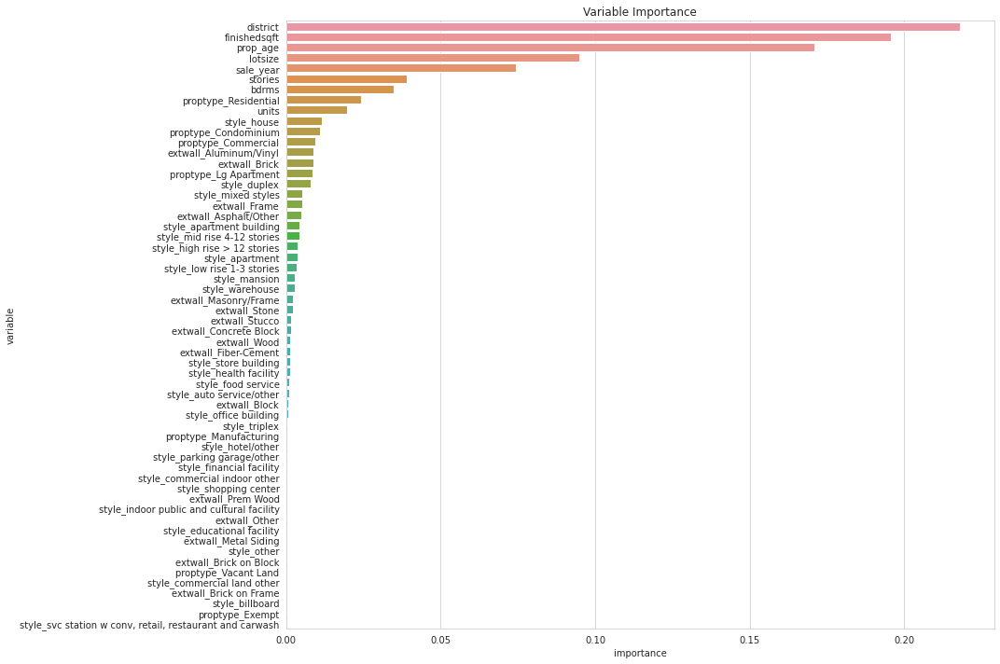

In [ ]:
plt.figure(figsize=(15,10))
sns.barplot(x="importance",
            y="variable",
            data=importance)
plt.title('Variable Importance')
plt.tight_layout()

District, finished sqft, propety age, lotsize and sale year are first 5 important features in predicting sale prices.

All the predicted and test values need to be transformed back to compare the  predictions to sale prices in $. To do that, first inverse transform (un-standardize) predicted values and test values and then exponentiate them to get the actual comparison.

In [ ]:
predict= model.predict(X_test)
predict_inv=scaler.inverse_transform(predict.reshape(-1,1))
predict_exp=np.exp(predict_inv)
y_test_inv = scaler.inverse_transform(y_test)
y_test_exp=np.exp(y_test_inv)
print('Log of Prediction=' , predict[:2])
print('Prediction=', predict_exp[:2])

Log of Prediction= [-0.02841028 -0.68489391]
Prediction= [[138231.99176905]
 [ 85887.28913532]]


Visualize the standardized ln predicted values vs standardized ln sale price values.


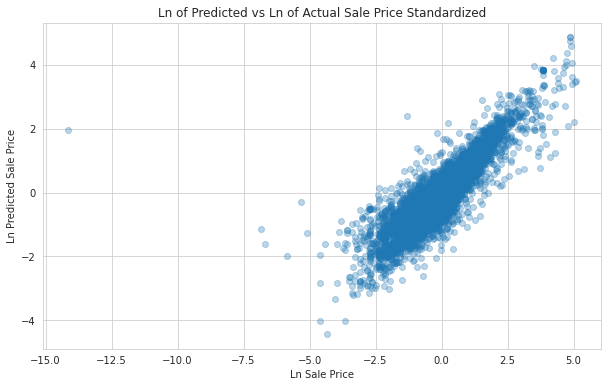

In [ ]:
plt.figure(figsize=(10,6))
sns.regplot(x=y_test, y=predict, fit_reg=False, scatter_kws={'alpha':0.3})
plt.title('Ln of Predicted vs Ln of Actual Sale Price Standardized')
plt.xlabel('Ln Sale Price')
plt.ylabel('Ln Predicted Sale Price')
plt.show()

The closer the points are to center diagonal 45 degree angle line, the more accurately they were predicted. The further the points from the line, the less accurate are the correcponding predictions.
Notice the points on both ends are quite away from the line and more dispersed, this is most likely due to having less number of observations in those value ranges. 

Plot the un-standardized ln predicted values vs un-standardized ln sale price values.

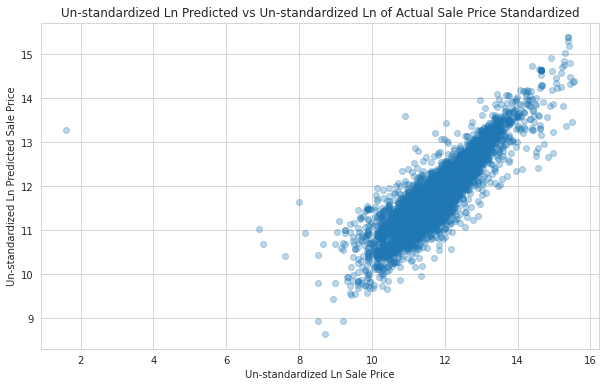

In [ ]:
plt.figure(figsize=(10,6))
sns.regplot(x=y_test_inv, y=predict_inv, fit_reg=False, scatter_kws={'alpha':0.3})
plt.title('Un-standardized Ln Predicted vs Un-standardized Ln of Actual Sale Price Standardized')
plt.xlabel('Un-standardized Ln Sale Price')
plt.ylabel('Un-standardized Ln Predicted Sale Price')
plt.show()

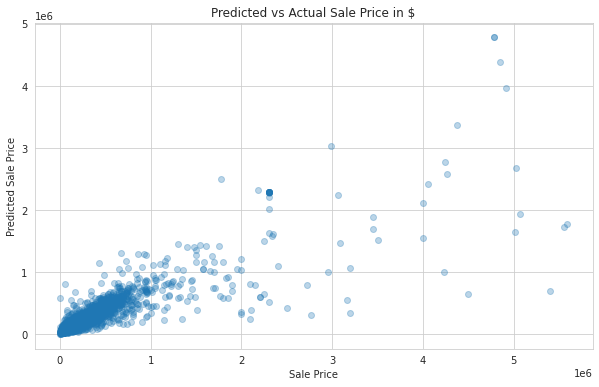

In [ ]:
# Scatter plot of Predicted vs Actual Sale Price
plt.figure(figsize=(10,6))
sns.regplot(x=np.exp(y_test_inv), y=np.exp(predict_inv), fit_reg=False, scatter_kws={'alpha':0.3})
plt.title('Predicted vs Actual Sale Price in $')
plt.xlabel('Sale Price')
plt.ylabel('Predicted Sale Price')
plt.show()

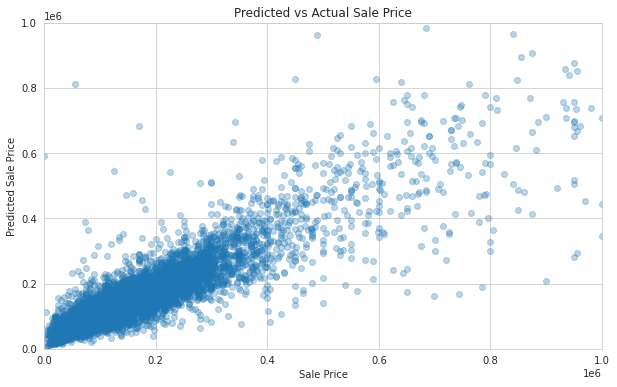

In [ ]:
# Scatter plot of Predicted vs Actual Sale Price with window limit of 1M^2
plt.figure(figsize=(10,6))
sns.regplot(x=y_test_exp, y=predict_exp, fit_reg=False, scatter_kws={'alpha':0.3})
plt.title('Predicted vs Actual Sale Price')
plt.xlabel('Sale Price')
plt.ylabel('Predicted Sale Price')
plt.xlim(0,1000000)
plt.ylim(0,1000000)
plt.show()

In [ ]:
np.sqrt(mean_squared_error(y_test_exp, predict_exp))

161632.4042742351

## 5. Summary

   The Milwaukee property sales data was cleaned by removing non useful variables, such as neighborhood which was number coded (without reference), address was not needed for the model, property id and condo project had majority of their values missing. For the remaining variables, all the empty observations were filled while keeping the same proprtion of each unique value, thus not altering their statistical distribution or changing the data proportions.

During the analysis, we limited the range of sale price to $6M to remove the extreme outliers and keeping the rest of outliers to preserve the nature of fluctuations in real estate prices while ensuring reliable results from the model. The variables sale month, number of half bath, full bath and rooms were discarded for either their almost non-existant correlation with target variable, sale price or strong correlation to other independent variable.

The target variable displayed right tail and the algorithms chosen work best with standardized data. Therefore, logarithm to target and rest of the variables had to be applied and standardized for consistency. 

Random Forest Regressor (RFR) method had a best performance out of series of regression algoriths including XGB Regressor, LGBM Regressor, Linear Regression, Ridge Regression, Lasso Regression, KNeighbors Regressor,Decision Tree Regressor and MLP Regressor with test set having the greatest R^2 & the least root mean squared error (RMSE) of 0.752 and 0.503 respectively. Next, the grid search was performed to optimize the hyper parameter, and apply the optimized parameters to RFR algorithm. The Optimized RFR had R^2 & the least root mean squared error (RMSE) of 0.761 and 0.493 respectively, yielding slightly better results.

With Optimized RFR, district, finished sqft, propety age, lotsize and sale year are first 5 important features in predicting the property sale prices. Lastly,  the predicted and actual sale prices were transformed back and compared visually and analytically yeilding RMSE of 161632.404, which is substantially larger than model results. 

In conclusion, analyzing the Milwaukee property sales data provided opportunities to exercise
* tackling emptry entries
* locating inconsistencies in sales records over the years (thus preventing introducing possible bias)
* proper numerical & categorical variable analysis
* identifying and removing some of the outliers
* transforming & inverse transforming variables before and after model training respectively for fair comparisons.